---
# **Project** : **Face Landmarks Detection on image and video**
---
### ---> **Sahil Kumar 777**

This project performs face landmarks detection in real time using mediapipe framework. The output can be used to recognize a user, and can be used in various applications like to identify human facial expressions and apply facial filters and effects to create a virtual avatar..

* **Objective :-** Detect Face landmarks
* **Modules :-** openCV, Mediapipe


## Install Important Libraries

In [ ]:
pip install mediapipe

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 54.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 90.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 20.7 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 5.29.5
    Uninstalling protobuf-5.29.5:
      Successfully uninstalled protobuf-5.29.5
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
grpcio-status 1.71.2 requires protobuf<6.0dev,>=5.26.1, but you have protobuf 4.25.8 which is incompatible.
ydf 0.12.0 requires protobuf<6.0.0,>=5.29.1, but you have protobuf 4.25.8 which is inco

## Functions to visualize results

### Face Landmark Visualization function for images

In [ ]:
import numpy as np
from mediapipe import solutions
from mediapipe.framework.formats import landmark_pb2
import matplotlib.pyplot as plt


def draw_landmarks_on_image(rgb_image, detection_result):
  face_landmarks_list = detection_result.face_landmarks
  annotated_image = np.copy(rgb_image)
  # Loop through the detected faces to visualize.
  for idx in range(len(face_landmarks_list)):
    face_landmarks = face_landmarks_list[idx]

    # Draw the face landmarks.
    face_landmarks_proto = landmark_pb2.NormalizedLandmarkList()
    face_landmarks_proto.landmark.extend([
      landmark_pb2.NormalizedLandmark(x=landmark.x, y=landmark.y, z=landmark.z) for landmark in face_landmarks
    ])


    solutions.drawing_utils.draw_landmarks(
        image=annotated_image,
        landmark_list=face_landmarks_proto,
        connections=mp.solutions.face_mesh.FACEMESH_TESSELATION,
        landmark_drawing_spec=None,
        connection_drawing_spec=mp.solutions.drawing_styles
        .get_default_face_mesh_tesselation_style())

    solutions.drawing_utils.draw_landmarks(
        image=annotated_image,
        landmark_list=face_landmarks_proto,
        connections=mp.solutions.face_mesh.FACEMESH_CONTOURS,
        landmark_drawing_spec=None,
        connection_drawing_spec=mp.solutions.drawing_styles
        .get_default_face_mesh_contours_style())

    solutions.drawing_utils.draw_landmarks(
        image=annotated_image,
        landmark_list=face_landmarks_proto,
        connections=mp.solutions.face_mesh.FACEMESH_IRISES,
        landmark_drawing_spec=None,
        connection_drawing_spec=mp.solutions.drawing_styles
        .get_default_face_mesh_iris_connections_style())

  return annotated_image

def plot_face_blendshapes_bar_graph(face_blendshapes):
  # Extract the face blendshapes category names and scores.
  face_blendshapes_names = [face_blendshapes_category.category_name for face_blendshapes_category in face_blendshapes]
  face_blendshapes_scores = [face_blendshapes_category.score for face_blendshapes_category in face_blendshapes]
  # The blendshapes are ordered in decreasing score value.
  face_blendshapes_ranks = range(len(face_blendshapes_names))

  fig, ax = plt.subplots(figsize=(12, 12))
  bar = ax.barh(face_blendshapes_ranks, face_blendshapes_scores, label=[str(x) for x in face_blendshapes_ranks])
  ax.set_yticks(face_blendshapes_ranks, face_blendshapes_names)
  ax.invert_yaxis()

  # Label each bar with values
  for score, patch in zip(face_blendshapes_scores, bar.patches):
    plt.text(patch.get_x() + patch.get_width(), patch.get_y(), f"{score:.4f}", va="top")

  ax.set_xlabel('Score')
  ax.set_title("Face Blendshapes")
  plt.tight_layout()
  plt.show()

### Generete and Save Video from ImageList

In [ ]:
# Convert To Video

import cv2
import mediapipe as mp

def visualize_video(filename,images) :
  """ Function to generate video from list of images.
      Args:
          filename
          images
      Return :
          It returns filename """

  imagesList = [image for image in images]

  # Define the codec and create a VideoWriter object
  fourcc = cv2.VideoWriter_fourcc(*'VP80')  # Can use other codecs like 'mp4v' (for .mp4 files) but mp4 converted files are not supported by coalb and browsers
  fps = 30  # Frames per second
  height, width, _ = imagesList[0].shape

  # Open VideoWriter
  video_writer =  cv2.VideoWriter(filename, fourcc, fps, (width, height))

  # Display gestures and hand landmarks.
  for image in imagesList:
    annotated_image = image.copy()
    video_writer.write(annotated_image)
  video_writer.release() # Closes VideoWriter
  return filename

### Function to Play Video In Colab

In [ ]:
from IPython.display import HTML
from base64 import b64encode

def play_video_in_colab(filepath) :

  with open(filepath,'rb') as file :
    mp4 = file.read()
    data_url = "data:video/"+ filepath.split('.')[-1] +";base64,"  + b64encode(mp4).decode()

  return HTML("""
    <video src="%s" type="video/webm" width="640" height="480" controls autoplay>
    </video>
  """  % data_url)

## Video face landmarks detection


In [ ]:
# Load the pre trained model
!wget -O face_landmarker_v2.task -q https://storage.googleapis.com/mediapipe-models/face_landmarker/face_landmarker/float16/1/face_landmarker.task

In [ ]:
import cv2
import mediapipe as mp

# Initializing the recogniser options
BaseOptions = mp.tasks.BaseOptions
FaceLandmarker = mp.tasks.vision.FaceLandmarker
FaceLandmarkerOptions = mp.tasks.vision.FaceLandmarkerOptions
VisionRunningMode = mp.tasks.vision.RunningMode

model_path = 'face_landmarker_v2.task'
options = FaceLandmarkerOptions(base_options=BaseOptions(model_asset_path=model_path),running_mode=VisionRunningMode.VIDEO)


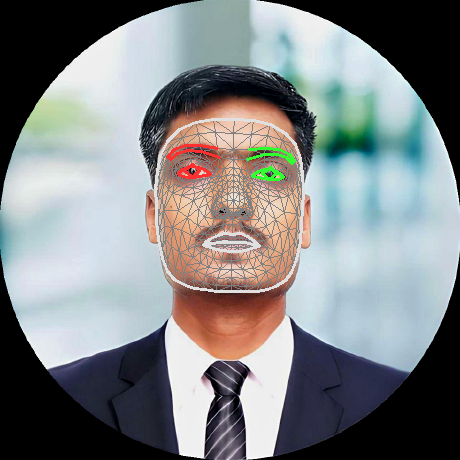

In [ ]:
### Guesture Recognition and Handpints Detection
from google.colab.patches import cv2_imshow

# STEP 1: Initialize the detector
with FaceLandmarker.create_from_options(options) as detector:

  image = mp.Image.create_from_file("SahilProfilePic.png") # Returns SRGBA format image

  # Convert the frame received from OpenCV to a MediaPipe’s Image object.
  # mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=image.numpy_view())

  # STEP 4: Recognize gestures in the input image.
  detection_result = detector.detect(image)

  # STEP 5: Process the result. In this case, visualize it.
  n = cv2.cvtColor(image.numpy_view(), cv2.COLOR_RGBA2BGR)
  annotated_image = draw_landmarks_on_image(n, detection_result)
  # cv2_imshow(annotated_image)
  cv2_imshow(annotated_image)

In [ ]:
detection_result

FaceLandmarkerResult(face_landmarks=[[NormalizedLandmark(x=0.5047875046730042, y=0.510860025882721, z=-0.054214540868997574, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.5070123076438904, y=0.4525497555732727, z=-0.08176306635141373, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.5062280297279358, y=0.47533392906188965, z=-0.0475725382566452, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.4948854446411133, y=0.40755510330200195, z=-0.05414368212223053, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.507285475730896, y=0.4363095164299011, z=-0.08459686487913132, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.5073298215866089, y=0.4188072681427002, z=-0.07548689842224121, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.5070316195487976, y=0.37893107533454895, z=-0.026113657280802727, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.3932824432849884, y=0.38138049840927124, z=0.030356604605913162, visibility=0.0, presence=0.0), NormalizedLandm

In [ ]:
# Blendshape graph
# plot_face_blendshapes_bar_graph(detection_result.face_blendshapes[0])

## Video face detection


In [ ]:
# Load the pre trained model
!wget -q -O faceDetector.tflite -q https://storage.googleapis.com/mediapipe-models/face_detector/blaze_face_short_range/float16/1/blaze_face_short_range.tflite


In [ ]:
import cv2
import mediapipe as mp

# Initializing the recogniser options
BaseOptions = mp.tasks.BaseOptions
FaceLandmarker = mp.tasks.vision.FaceLandmarker
FaceLandmarkerOptions = mp.tasks.vision.FaceLandmarkerOptions
VisionRunningMode = mp.tasks.vision.RunningMode

model_path = 'face_landmarker_v2.task'
options = FaceLandmarkerOptions(base_options=BaseOptions(model_asset_path=model_path),running_mode=VisionRunningMode.VIDEO)


In [ ]:
### Guesture Recognition and Handpints Detection

# STEP 1: Initialize the detector
with FaceLandmarker.create_from_options(options) as detector:

  # STEP 2: Intialize the video capturing into frames
  cap = cv2.VideoCapture('InputVideo.mp4')
  fps = cap.get(cv2.CAP_PROP_FPS)
  images=[]
  results=[]
  i=0

  while cap.isOpened():

    # STEP 3: Read the frames one by one
    success,frame = cap.read();

    if not success :
      if i==0:
        print('Empty frame')
      else :
        print('Detection Completed')
        print('Total Frames : ',i)
      break

    frame_timestamp_ms = int(cap.get(cv2.CAP_PROP_POS_MSEC)) # Get timestamp of the frame
    # frame = cv2.flip(frame, 1) # flip the frame

    # Convert the frame received from OpenCV to a MediaPipe’s Image object.
    mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=frame)

    # STEP 4: Recognize gestures in the input image.
    detection_result = detector.detect_for_video(mp_image,frame_timestamp_ms)

    # STEP 5: Process the result. In this case, visualize it.
    # n = cv2.cvtColor(image.numpy_view(), cv2.COLOR_RGBA2BGR)
    annotated_image = draw_landmarks_on_image(frame, detection_result)

    images.append(annotated_image)
    i+=1

  cap.release()


Detection Completed
Total Frames :  317


In [ ]:
visualize_video('OutputVideo1.webm',images)

'OutputVideo1.webm'

In [ ]:
play_video_in_colab('OutputVideo1.webm')

In [ ]:
detection_result

In [ ]:
plot_face_blendshapes_bar_graph(detection_result.face_blendshapes[0])